<div align="center">
    <img src="Logo.png" width="1000">
</div>

------

# 🧠 Agentic Loan Approval Automation using LandingAI
This notebook demonstrates how to use the `landingai-ade` Python library to process merged PDF files containing multiple document types using LandingAI’s Agentic Document Extraction (ADE). You’ll learn how to parse, classify & split, and extract structured data from complex document packets - complete with visual grounding for full auditability and traceability.

### End-to-end ADE workflow:
1. Authenticate with the ADE API & Standard Imports
2. Inspect & Visualize Mixed, User-Submitted Documents
3. Define Field-Extraction Schemas for Each Document Type
4. Parse & classify a Merged PDF Containing Multiple Document Types
5. Split the Merged Packet into Logical Sub-Documents
6. Apply the Correct Schema to Each Split Document
7. Visualize Extraction Results with Bounding Boxes
8. Extract Structured Data with Full Visual Grounding References

------

## 📦 0. Install ADE

Install necessary packages for document extraction and processing:

```bash
landingai-ade  # LandingAI ADE Python SDK
pillow         # For image processing
pymupdf        # For PDF processing
python-dotenv  # For managing ADE API key
```

In [ ]:
!pip install landingai-ade
!pip install pillow
!pip install pymupdf
!pip install python-dotenv

---

## 🔐 1. Authenticate with the ADE API & Standard Imports

Set up your API credentials to access LandingAI's Agentic Document Extraction.
- Obtain your API Key from the Visual Playground at https://va.landing.ai/settings/api-key
- Read about options for setting your API key at https://docs.landing.ai/ade/agentic-api-key

For this example, we use environment variables to store credentials securely.

In [1]:
# Import LandingAI's ADE Python Library
from landingai_ade import LandingAIADE
from landingai_ade.lib import pydantic_to_json_schema
from landingai_ade.types import ParseResponse, ExtractResponse

# Standard imports
from pathlib import Path
from PIL import Image, ImageDraw
from IPython.display import display, HTML
from pydantic import BaseModel, Field
from typing import Literal
from io import BytesIO

import base64
import pymupdf
import os

# Import utility functions 
from ade_utils import (
    cleanup_results_folders,
    save_to_cache,
    load_from_cache,
    save_parse_result_for_viz,
    load_parse_result_for_viz,
    create_scrollable_pdf_viewer,
    group_pages_by_document_type,
    draw_bounding_boxes_for_split,
    visualize_extractions_side_by_side,
    print_classification_summary,
    print_split_summary,
    print_extraction_summary
)

# Load the API key from .env file
from dotenv import load_dotenv
load_dotenv()

# Verify the API key is loaded
if os.getenv('VISION_AGENT_API_KEY'):
    print('✓ API key loaded successfully from .env file')
else:
    print('✗ Warning: VISION_AGENT_API_KEY not found in .env file')

# Clean up results folders from previous runs (keeps cache intact)
cleanup_results_folders()

✓ API key loaded successfully from .env file
✓ Results folders cleaned and ready


In [3]:
# Instantiate the LandingAI ADE Client
client = LandingAIADE()

------

## 📂 2. Inspect & Visualize Mixed, User-Submitted Documents

**Scenario:** You are a bank that issuing loans. Each applicant sends various financial documents — pay stubs, bank statements, investment statements — containing income and asset information all in one document as a "packet".

**Challenge:** Different document types contain different fields. You need to:
1. Automatically categorize each document type
2. Extract the relevant financial data based on the document category
3. Maintain audit trails showing where each value came from

**Solution:** Use ADE to automatically categorize documents and apply document-specific extraction schemas.

### 2.1 Preview a Sample Document

Let's first look at the document to understand what we're working with.

### 2.2 Document Categorization Schema

Each document type requires its own extraction logic, so the first step is to **classify** every document in the packet.

This packet includes three document types:

- **pay_stub** — employee earnings statements  
- **bank_statement** — account balances and transaction histories  
- **investment_statement** — portfolio holdings, gains/losses, and performance details  

Below is the Pydantic schema used to represent document type classifications:

In [7]:
# Define document type classification schema
class DocType(BaseModel):
    type: Literal["pay_stub", "bank_statement", "investment_statement"] = Field(
        description="The type of the document.",
        title="Document Type",
    )

------

## 🧩 3. Define Field-Extraction Schemas for Each Document Type

### 3.1 Define a Schema per Document Type:
- **Pay Stub**: Employee name, pay period, gross pay, and net pay
- **Bank Statement**: Bank name, account number, and current balance
- **Investment Statement**: Investment year, total investment, and changes in value

Each schema uses descriptive fields that guide the extraction process:

In [9]:
# Schema for Bank Statements
class BankStatementSchema(BaseModel):
    bank_name: str = Field(
        description="The name of the bank.",
        title="Bank Name",
    )
    account_number: str = Field(
        description="The bank account number.",
        title="Account Number",
    )
    balance: float = Field(
        description="The current balance of the bank account.",
        title="Balance",
    )

# Schema for Investment Statements
class InvestmentStatementSchema(BaseModel):
    investment_year: int = Field(
        description="The year of the investment statement.",
        title="Investment Year",
    )
    total_investment: float = Field(
        description="The total amount invested.",
        title="Total Investment",
    )
    changes_in_value: float = Field(
        description="The changes in the value of the investments.",
        title="Changes in Value",
    )

# Schema for Pay Stubs
class PaymentStubSchema(BaseModel):
    employee_name: str = Field(
        description="The name of the employee.",
        title="Employee Name",
    )
    pay_period: str = Field(
        description="The pay period for the stub.",
        title="Pay Period",
    )
    gross_pay: float = Field(
        description="The gross pay amount.",
        title="Gross Pay",
    )
    net_pay: float = Field(
        description="The net pay amount after deductions.",
        title="Net Pay",
    )

### 3.2 Mapping Documents to Schema 

In [11]:
# Map document types to their corresponding schemas
schema_per_doc_type = {
    "bank_statement": BankStatementSchema,
    "investment_statement": InvestmentStatementSchema,
    "pay_stub": PaymentStubSchema,
}

# Convert the document type schema to JSON format for API calls
doc_type_json_schema = pydantic_to_json_schema(DocType)

---

## 4. Parse & Classify a Merged PDF Containing Multiple Document Types

In [13]:
# Step 1: Parse the merged document by pages to enable classification
merged_document = documents_folder / "loan_packet.pdf"
print(f"Processing merged document: {merged_document.name}")

# Try to load from cache first
cached_classifications = load_from_cache("page_classifications")

if cached_classifications:
    print("✓ Loaded from cache (skipping API calls)")
    page_classifications = cached_classifications
    print(f"Total pages: {len(page_classifications)}")
    
    # Try to load parse_result for visualization
    parse_result = load_parse_result_for_viz()
    if not parse_result:
        print("⚠️  Warning: parse_result not in cache, will need to re-parse for visualization")
else:
    print("⚡ Calling API to parse and classify document...")
    # Parse the entire document split by pages
    parse_result: ParseResponse = client.parse(
        document=merged_document,
        split="page",
        model="dpt-2-latest"
    )
    print(f"Parsing completed. Total pages: {len(parse_result.splits)}")
    
    # Save parse result to cache (pickle for full object, json for metadata)
    save_parse_result_for_viz(parse_result)
    save_to_cache("parse_result", parse_result)

    # Step 2: Classify each page to determine document boundaries
    page_classifications = []

    for idx, split in enumerate(parse_result.splits):
        first_page_markdown = split.markdown
        
        # Extract document type using the categorization schema
        extraction_result: ExtractResponse = client.extract(
            schema=doc_type_json_schema,
            markdown=first_page_markdown
        )
        doc_type = extraction_result.extraction["type"]
        
        page_classifications.append({
            "page": idx,
            "doc_type": doc_type,
            "split": split
        })
    
    # Save classifications to cache
    save_to_cache("page_classifications", page_classifications)
    print("✓ Results cached for future runs")

# Print classification summary
print_classification_summary(page_classifications)

Processing merged document: loan_packet.pdf
✓ Loaded from cache (skipping API calls)
Total pages: 30

=== Classification Summary ===
Page 1: pay_stub
Page 2: bank_statement
Page 3: investment_statement
Page 4: investment_statement
Page 5: investment_statement
Page 6: investment_statement
Page 7: investment_statement
Page 8: investment_statement
Page 9: investment_statement
Page 10: investment_statement
Page 11: investment_statement
Page 12: investment_statement
Page 13: investment_statement
Page 14: investment_statement
Page 15: investment_statement
Page 16: investment_statement
Page 17: investment_statement
Page 18: investment_statement
Page 19: investment_statement
Page 20: investment_statement
Page 21: investment_statement
Page 22: investment_statement
Page 23: investment_statement
Page 24: investment_statement
Page 25: investment_statement
Page 26: investment_statement
Page 27: investment_statement
Page 28: investment_statement
Page 29: investment_statement
Page 30: investment_stat

------

## 📑 5. Split Documents Based on Classification

Now that we've classified each page, we need to split the merged document into separate documents based on document type boundaries. This creates individual documents for each section.

In [15]:
# Step 3: Group consecutive pages of the same type into logical documents
split_documents = group_pages_by_document_type(page_classifications)

# Print split document summary
print_split_summary(split_documents)


=== Document Split Summary ===
pay_stub_1:
  Type: pay_stub
  Pages: 1-1
  Total pages: 1
bank_statement_2:
  Type: bank_statement
  Pages: 2-2
  Total pages: 1
investment_statement_3:
  Type: investment_statement
  Pages: 3-30
  Total pages: 28


------

## 📊 6. Apply the Correct Schema to Each Split Document

Now that we have split the documents, we can apply the appropriate extraction schema to each document to get the specific financial fields we need.

### Each extraction includes:
- **extraction:** The structured data values
- **extraction_metadata:** References showing where each value was found in the document

In [17]:
# Dictionary to store extraction results
cached_extractions = load_from_cache("document_extractions")

if cached_extractions:
    print("✓ Loaded extractions from cache (skipping API calls)\n")
    document_extractions = cached_extractions
else:
    print("⚡ Calling API to extract data...")
    document_extractions = {}
    
    # Extract financial data from each split document using its specific schema
    for doc_name, doc_info in split_documents.items():
        print(f"\nProcessing split document: {doc_name}")
        print(f"Document type: {doc_info['doc_type']}")

        # Get the appropriate schema for this document type
        json_schema = pydantic_to_json_schema(
            schema_per_doc_type[doc_info["doc_type"]]
        )
        
        # Extract structured data using the schema
        extraction_result: ExtractResponse = client.extract(
            schema=json_schema, 
            markdown=doc_info["markdown"]
        )
        print("Detailed Extraction:", extraction_result.extraction)

        # Store extraction results
        document_extractions[doc_name] = {
            "doc_type": doc_info["doc_type"],
            "pages": doc_info["pages"],
            "extraction": extraction_result.extraction,
            "extraction_metadata": extraction_result.extraction_metadata,
        }
    
    # Save to cache for future runs
    save_to_cache("document_extractions", document_extractions)
    print("\n✓ Extractions cached for future runs")

# Print extraction summary
print_extraction_summary(document_extractions)

✓ Loaded extractions from cache (skipping API calls)


=== All Extractions Complete ===

pay_stub_1:
  Type: pay_stub
  Pages: [0]
  Data: {'employee_name': 'MICHAEL D BRYAN', 'pay_period': '03/19/2021', 'gross_pay': 452.43, 'net_pay': 291.9}

bank_statement_2:
  Type: bank_statement
  Pages: [1]
  Data: {'bank_name': 'Royal Bank of Canada', 'account_number': '02782-5094431', 'balance': 3664.79}

investment_statement_3:
  Type: investment_statement
  Pages: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
  Data: {'investment_year': 2015, 'total_investment': 274222.2, 'changes_in_value': 21000.37}


---

## 🖼️ 7. Visualize Extraction Results with Bounding Boxes

In [19]:
# Define color scheme for different chunk types
CHUNK_TYPE_COLORS = {
    "chunkText": (40, 167, 69),        # Green
    "chunkTable": (0, 123, 255),       # Blue
    "chunkMarginalia": (111, 66, 193), # Purple
    "chunkFigure": (255, 0, 255),      # Magenta
    "chunkLogo": (144, 238, 144),      # Light green
    "chunkCard": (255, 165, 0),        # Orange
    "chunkAttestation": (0, 255, 255), # Cyan
    "chunkScanCode": (255, 193, 7),    # Yellow
    "chunkForm": (220, 20, 60),        # Red
    "tableCell": (173, 216, 230),      # Light blue
    "table": (70, 130, 180),           # Steel blue
}

def draw_bounding_boxes_for_split(groundings, document_path, page_numbers, base_path="."):
    """
    Draw bounding boxes on specific pages of a document to visualize parsed chunks.
    
    Args:
        groundings: Dictionary of grounding objects with chunk locations
        document_path: Path to the original merged document
        page_numbers: List of page numbers to visualize (0-indexed)
        base_path: Directory to save annotated images
    """
    def create_annotated_image(image, groundings, page_num=0):
        """Create an annotated image with grounding boxes and labels."""
        annotated_img = image.copy()
        draw = ImageDraw.Draw(annotated_img)

        img_width, img_height = image.size

        groundings_found = 0
        for gid, grounding in groundings.items():
            # Check if grounding belongs to this page
            if grounding.page != page_num:
                continue

            groundings_found += 1
            box = grounding.box

            # Extract normalized coordinates from box
            left, top, right, bottom = box.left, box.top, box.right, box.bottom

            # Convert normalized coordinates to pixel coordinates
            x1 = int(left * img_width)
            y1 = int(top * img_height)
            x2 = int(right * img_width)
            y2 = int(bottom * img_height)

            # Draw bounding box with color based on chunk type
            color = CHUNK_TYPE_COLORS.get(grounding.type, (128, 128, 128))
            draw.rectangle([x1, y1, x2, y2], outline=color, width=3)

            # Draw label background and text
            label = f"{grounding.type}:{gid}"
            label_y = max(0, y1 - 20)
            draw.rectangle([x1, label_y, x1 + len(label) * 8, y1], fill=color)
            draw.text((x1 + 2, label_y + 2), label, fill=(255, 255, 255))

        if groundings_found == 0:
            return None
        return annotated_img

    # Handle PDF documents
    if document_path.suffix.lower() == '.pdf':
        pdf = pymupdf.open(document_path)

        for page_num in page_numbers:
            page = pdf[page_num]
            pix = page.get_pixmap(matrix=pymupdf.Matrix(2, 2))  # 2x scaling
            img = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)

            # Create and save annotated image for this page
            annotated_img = create_annotated_image(img, groundings, page_num)
            if annotated_img is not None:
                annotated_path = f"{base_path}/page_{page_num + 1}_annotated.png"
                annotated_img.save(annotated_path)
                print(f"Annotated image saved to: {annotated_path}")

        pdf.close()
    
    return True

# Combine split document information with extraction results
final_extractions = {}

for doc_name, extraction in document_extractions.items():
    final_extractions[doc_name] = {
        **extraction,
        "splits": split_documents[doc_name]["splits"]
    }

# Visualize all parsed chunks for each split document
for doc_name, extraction in final_extractions.items():
    print(f"\nVisualizing split document: {doc_name}")
    base_path = f"results/{doc_name}"
    os.makedirs(base_path, exist_ok=True)
    
    # Get grounding information from the parse result
    draw_bounding_boxes_for_split(
        parse_result.grounding,
        merged_document,
        extraction["pages"],
        base_path=base_path
    )

print("\n=== Visualization complete for all split documents ===")


Visualizing split document: pay_stub_1
Annotated image saved to: results/pay_stub_1/page_1_annotated.png

Visualizing split document: bank_statement_2
Annotated image saved to: results/bank_statement_2/page_2_annotated.png

Visualizing split document: investment_statement_3
Annotated image saved to: results/investment_statement_3/page_3_annotated.png
Annotated image saved to: results/investment_statement_3/page_4_annotated.png
Annotated image saved to: results/investment_statement_3/page_5_annotated.png
Annotated image saved to: results/investment_statement_3/page_6_annotated.png
Annotated image saved to: results/investment_statement_3/page_7_annotated.png
Annotated image saved to: results/investment_statement_3/page_8_annotated.png
Annotated image saved to: results/investment_statement_3/page_9_annotated.png
Annotated image saved to: results/investment_statement_3/page_10_annotated.png
Annotated image saved to: results/investment_statement_3/page_11_annotated.png
Annotated image save


Document: pay_stub_1
Type: pay_stub

📋 Extracted Fields:
  • employee_name: MICHAEL D BRYAN
  • pay_period: 03/19/2021
  • gross_pay: 452.43
  • net_pay: 291.9




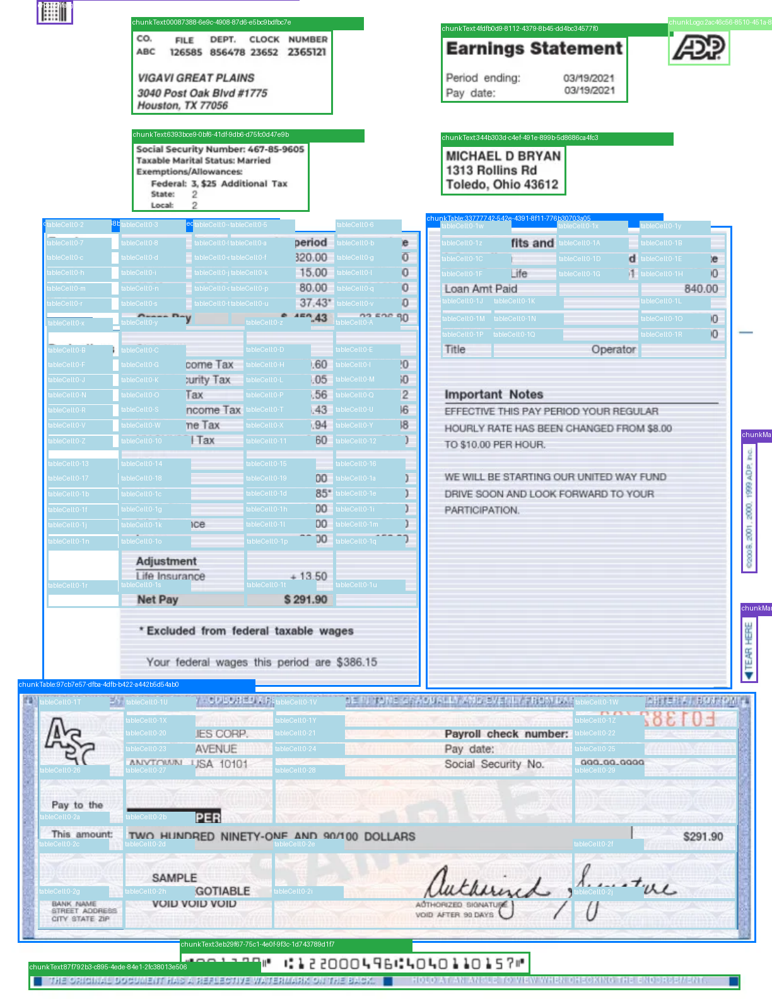


🔍 Extraction Metadata (Source Chunks):
  • employee_name: chunk IDs [344b303d-c4ef-491e-899b-5d8686ca4fc3]
  • pay_period: chunk IDs [4fdfb0d9-8112-4379-8b45-dd4bc34577f0]
  • gross_pay: chunk IDs [0-u]
  • net_pay: chunk IDs [0-1t]



Document: bank_statement_2
Type: bank_statement

📋 Extracted Fields:
  • bank_name: Royal Bank of Canada
  • account_number: 02782-5094431
  • balance: 3664.79




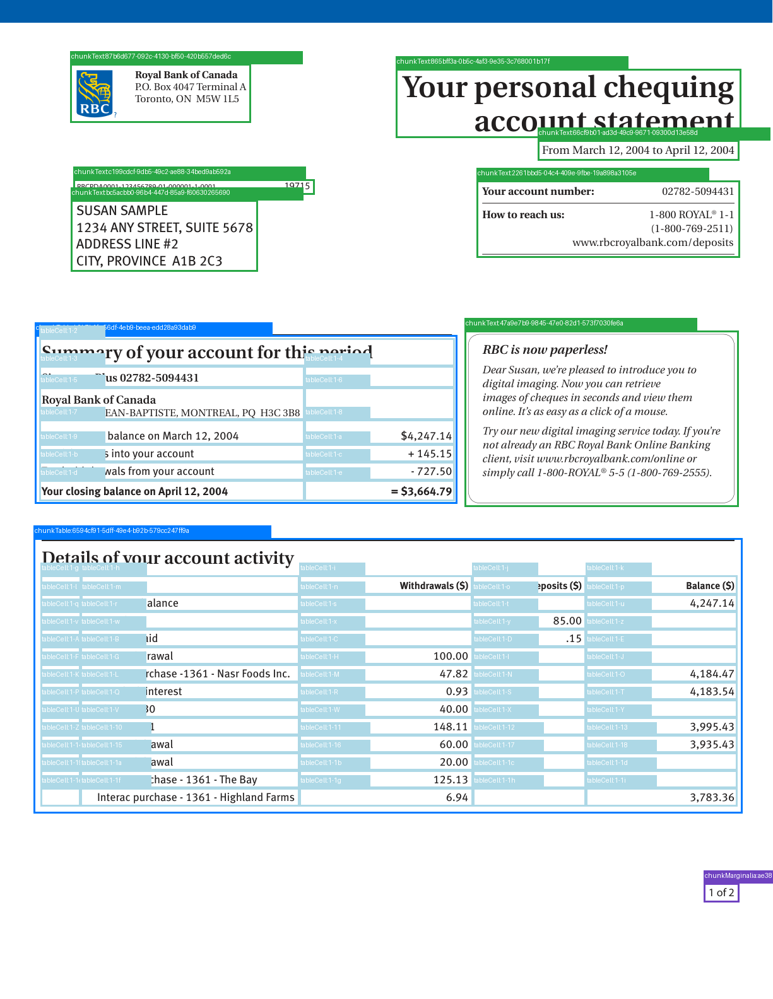


🔍 Extraction Metadata (Source Chunks):
  • bank_name: chunk IDs [87b6d677-092c-4130-bf50-420b557ded6c]
  • account_number: chunk IDs [2261bbd5-04c4-409e-9fbe-19a898a3105e]
  • balance: chunk IDs [1-e]



Document: investment_statement_3
Type: investment_statement

📋 Extracted Fields:
  • investment_year: 2015
  • total_investment: 274222.2
  • changes_in_value: 21000.37




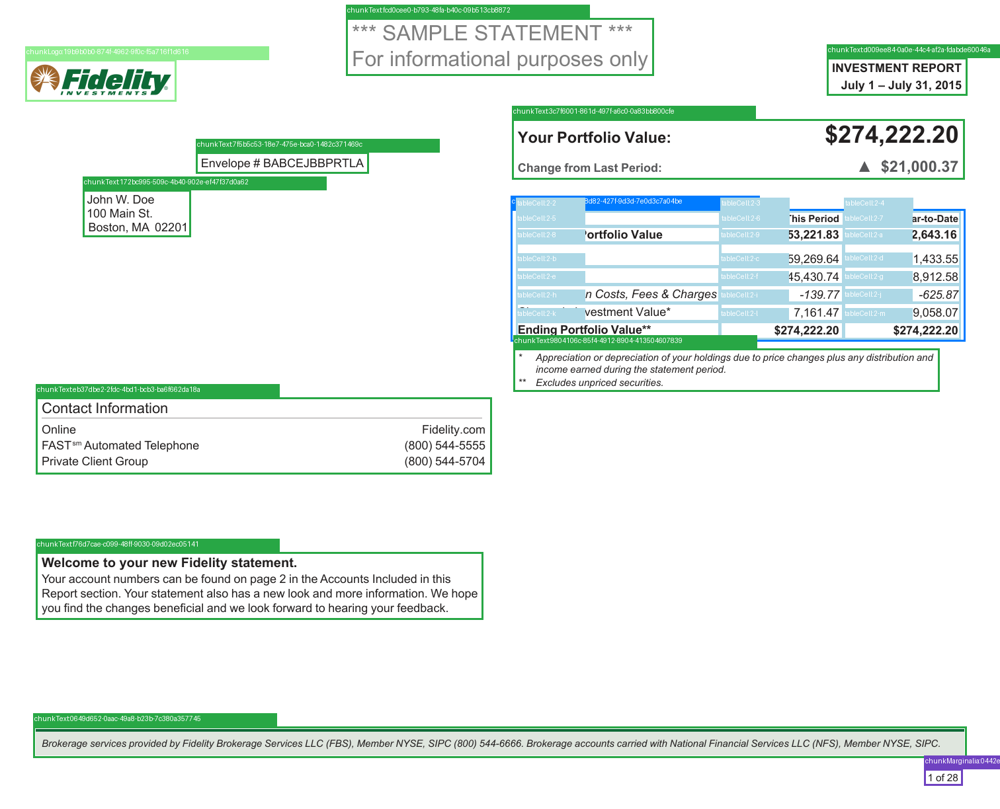


🔍 Extraction Metadata (Source Chunks):
  • investment_year: chunk IDs [d009ee84-0a0e-44c4-af2a-fdabde60046a]
  • total_investment: chunk IDs [3c7f6001-861d-497f-a6c0-0a83bb800cfe]
  • changes_in_value: chunk IDs [3c7f6001-861d-497f-a6c0-0a83bb800cfe]



✅ Visualization complete!


In [21]:
# Iterate through each split document
for doc_name, extraction in final_extractions.items():
    print(f"\n{'='*80}")
    print(f"Document: {doc_name}")
    print(f"Type: {extraction['doc_type']}")
    print(f"{'='*80}\n")
    
    # Display extracted data
    print("📋 Extracted Fields:")
    for field_name, field_value in extraction['extraction'].items():
        print(f"  • {field_name}: {field_value}")
    print()
    
    # Get the first page for this document
    first_page = extraction['pages'][0]
    
    # Create side-by-side HTML visualization
    html_parts = ['<div style="display: flex; gap: 20px; margin-bottom: 30px;">']
    
    # Left side: Extracted fields with chunk highlights
    extracted_img_path = Path(f"results_extracted/{doc_name}/page_{first_page + 1}_annotated.png")
    if extracted_img_path.exists():
        img = Image.open(extracted_img_path)
        buffered = BytesIO()
        img.save(buffered, format="PNG")
        img_str = base64.b64encode(buffered.getvalue()).decode()
        
        html_parts.append(f'''
        <div style="flex: 1;">
            <h4 style="text-align: center; color: #e74c3c;">🎯 Extracted Fields Only</h4>
            <img src="data:image/png;base64,{img_str}" style="width: 100%; border: 2px solid #e74c3c;">
            <p style="text-align: center; color: #555; font-size: 12px;">Highlighted regions show extracted field locations</p>
        </div>
        ''')
    
    # Right side: All chunks annotated
    full_img_path = Path(f"results/{doc_name}/page_{first_page + 1}_annotated.png")
    if full_img_path.exists():
        img = Image.open(full_img_path)
        buffered = BytesIO()
        img.save(buffered, format="PNG")
        img_str = base64.b64encode(buffered.getvalue()).decode()
        
        html_parts.append(f'''
        <div style="flex: 1;">
            <h4 style="text-align: center; color: #3498db;">📄 All Parsed Chunks</h4>
            <img src="data:image/png;base64,{img_str}" style="width: 100%; border: 2px solid #3498db;">
            <p style="text-align: center; color: #555; font-size: 12px;">All detected content chunks with labels</p>
        </div>
        ''')
    
    html_parts.append('</div>')
    
    # Display the side-by-side comparison
    display(HTML(''.join(html_parts)))
    
    # Show extraction metadata (which chunks were used)
    print("\n🔍 Extraction Metadata (Source Chunks):")
    for field_name, metadata in extraction['extraction_metadata'].items():
        chunk_refs = ', '.join(metadata['references'])
        print(f"  • {field_name}: chunk IDs [{chunk_refs}]")
    print("\n")

print("\n✅ Visualization complete!")

---

## 🔬 8. Extract Structured Data with Full Visual Grounding References
#### Shows: (1) Extracted Field (2) Cropped Chunk Image, (2) Full Page with Specific Chunk ONLY

📊 Extracted Field Visualizations with Side-by-Side Comparison


Document: pay_stub_1
Type: pay_stub

📋 Extracted Fields:
  • employee_name: MICHAEL D BRYAN
  • pay_period: 03/19/2021
  • gross_pay: 452.43
  • net_pay: 291.9




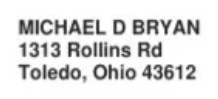
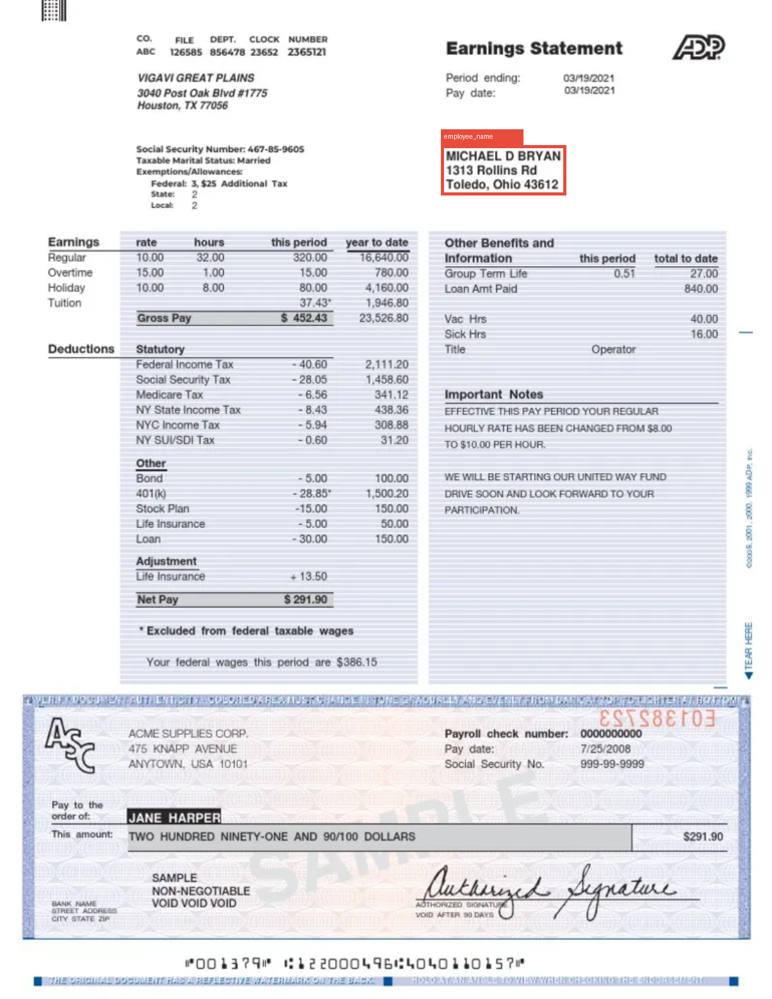


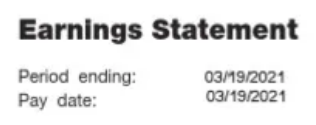
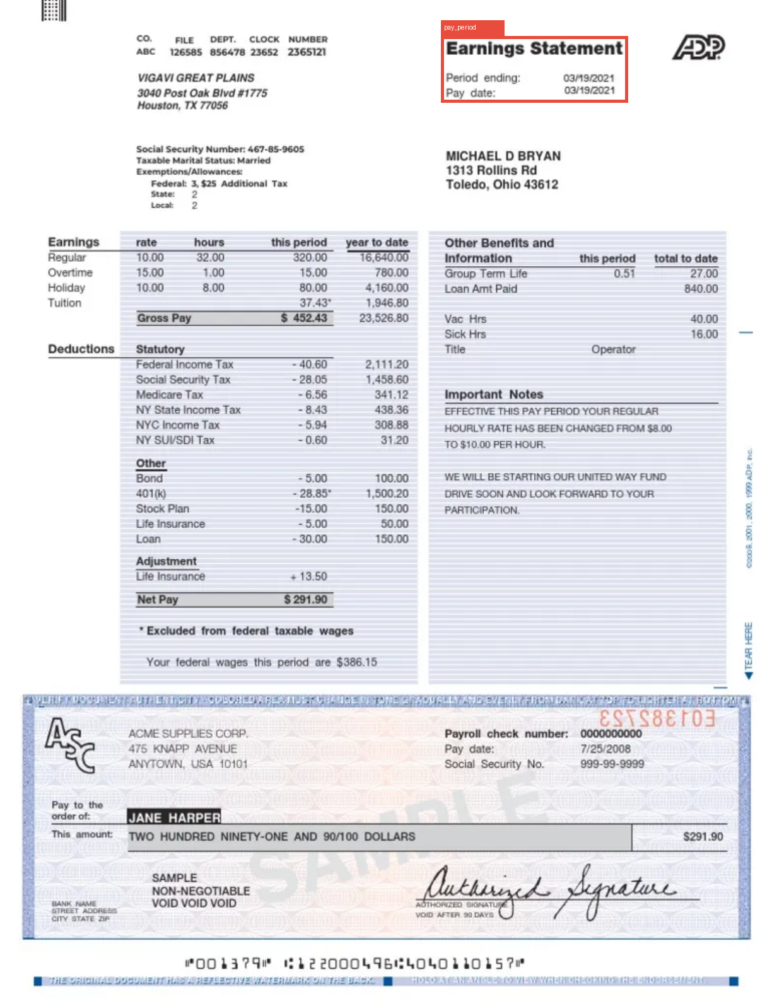


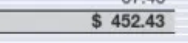
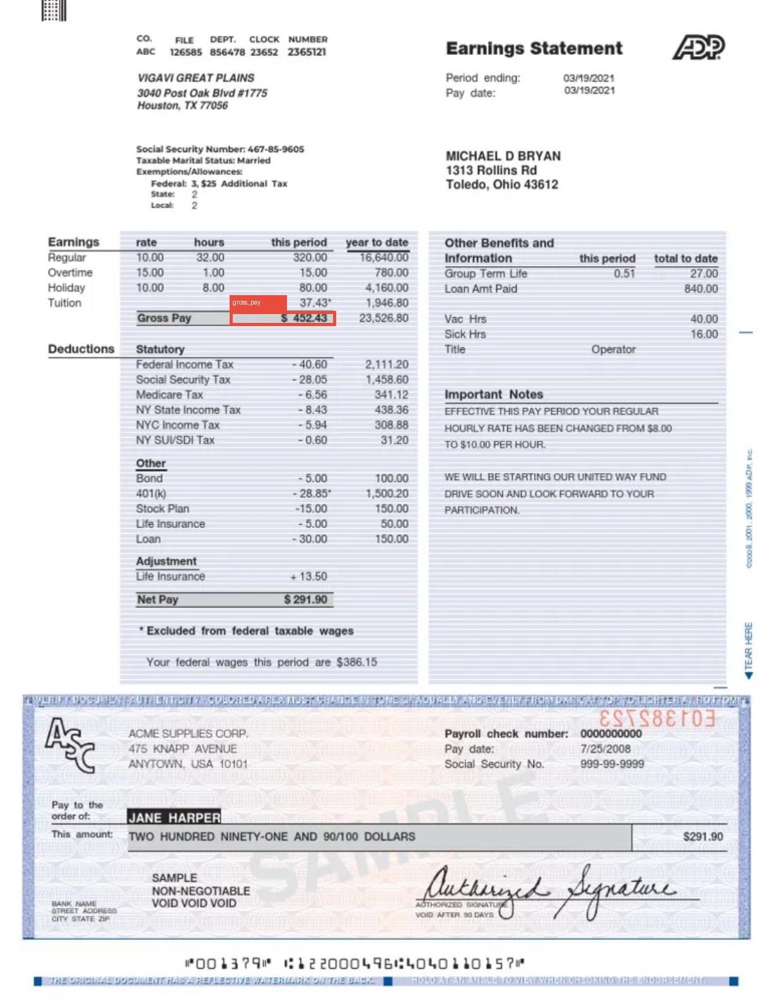


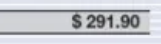
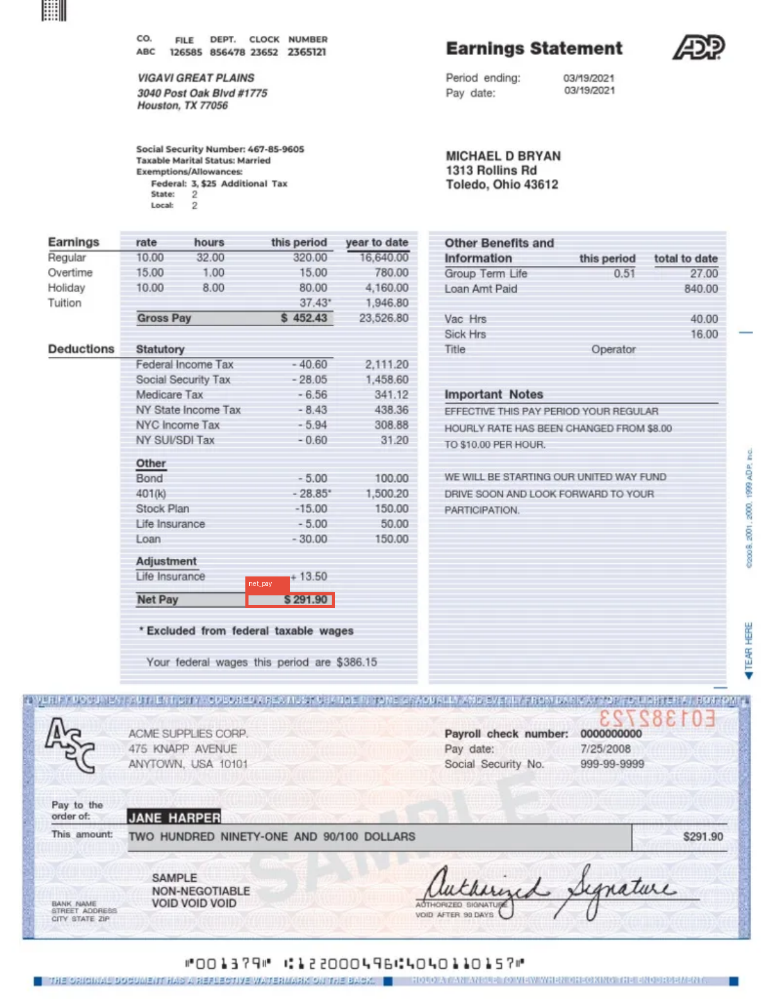


🔍 Extraction Metadata (Source Chunks):
  • employee_name: chunk IDs [344b303d-c4ef-491e-899b-5d8686ca4fc3]
  • pay_period: chunk IDs [4fdfb0d9-8112-4379-8b45-dd4bc34577f0]
  • gross_pay: chunk IDs [0-u]
  • net_pay: chunk IDs [0-1t]



Document: bank_statement_2
Type: bank_statement

📋 Extracted Fields:
  • bank_name: Royal Bank of Canada
  • account_number: 02782-5094431
  • balance: 3664.79




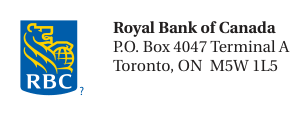
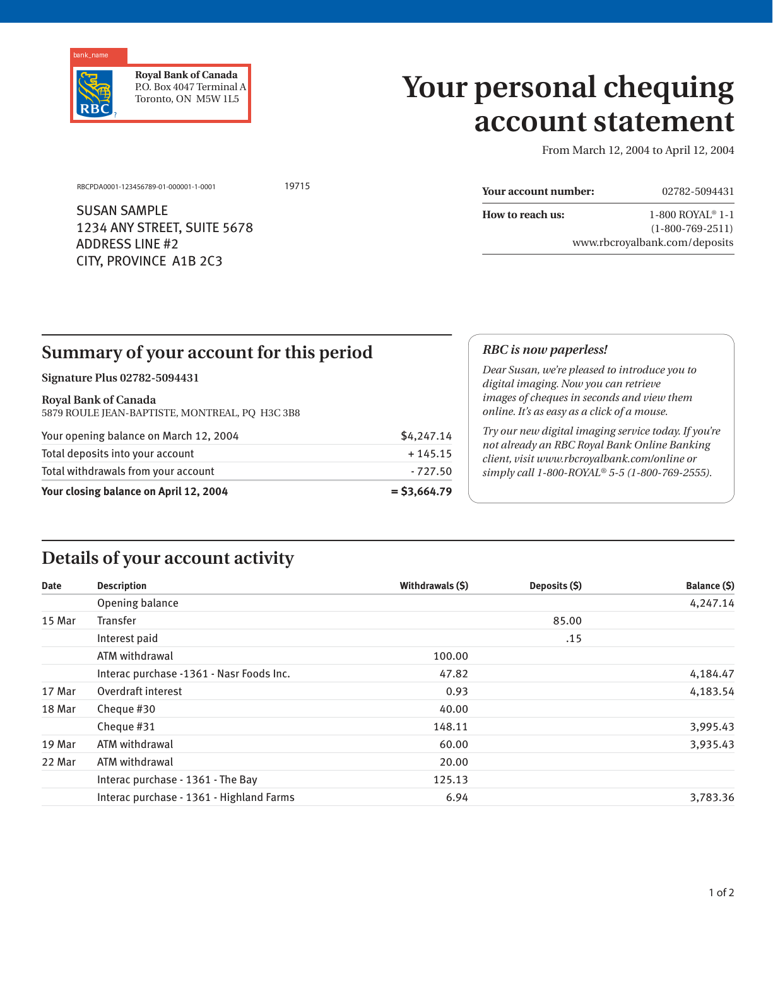


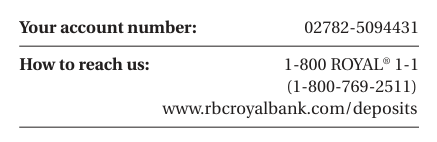
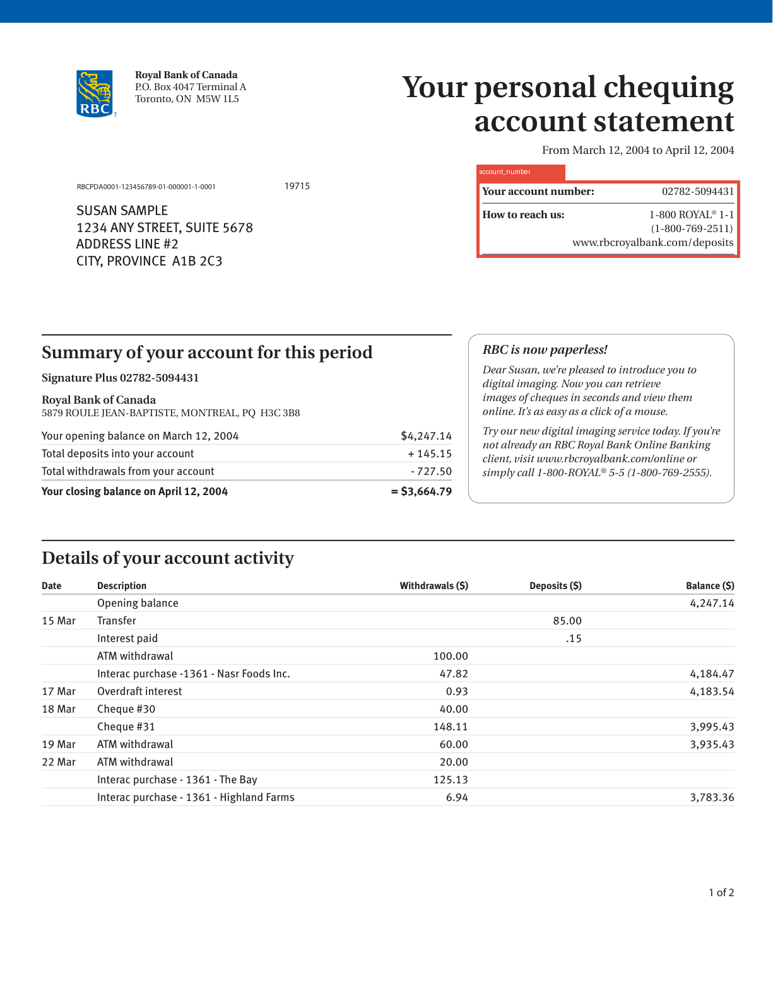


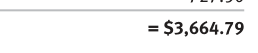
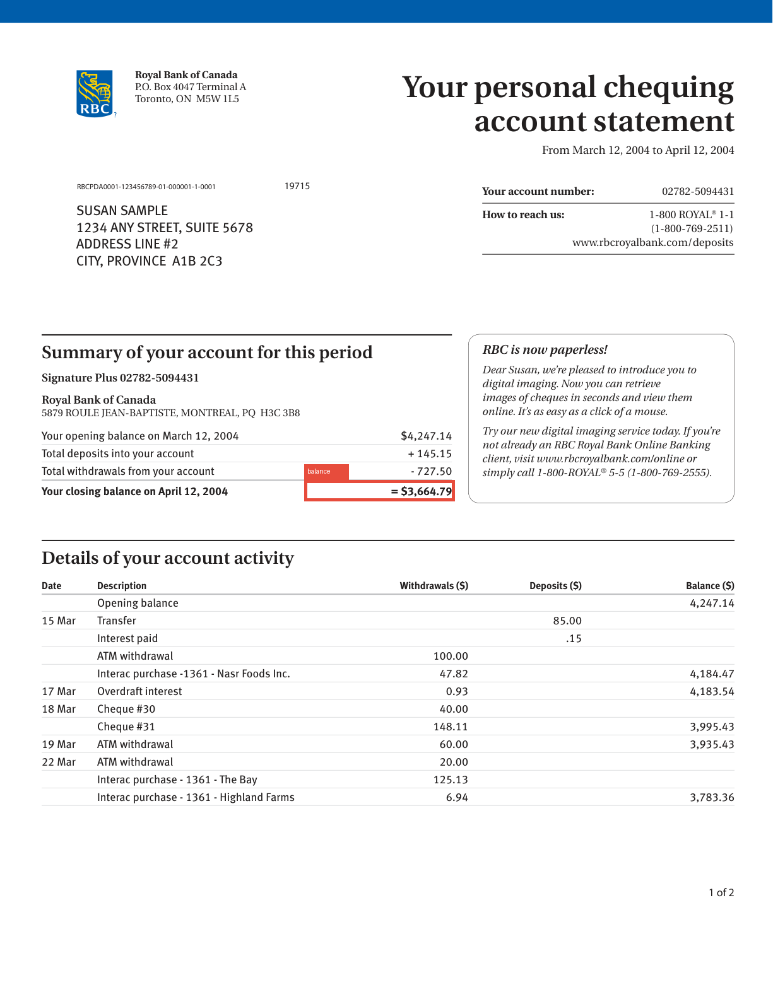


🔍 Extraction Metadata (Source Chunks):
  • bank_name: chunk IDs [87b6d677-092c-4130-bf50-420b557ded6c]
  • account_number: chunk IDs [2261bbd5-04c4-409e-9fbe-19a898a3105e]
  • balance: chunk IDs [1-e]



Document: investment_statement_3
Type: investment_statement

📋 Extracted Fields:
  • investment_year: 2015
  • total_investment: 274222.2
  • changes_in_value: 21000.37




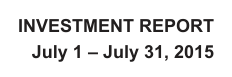
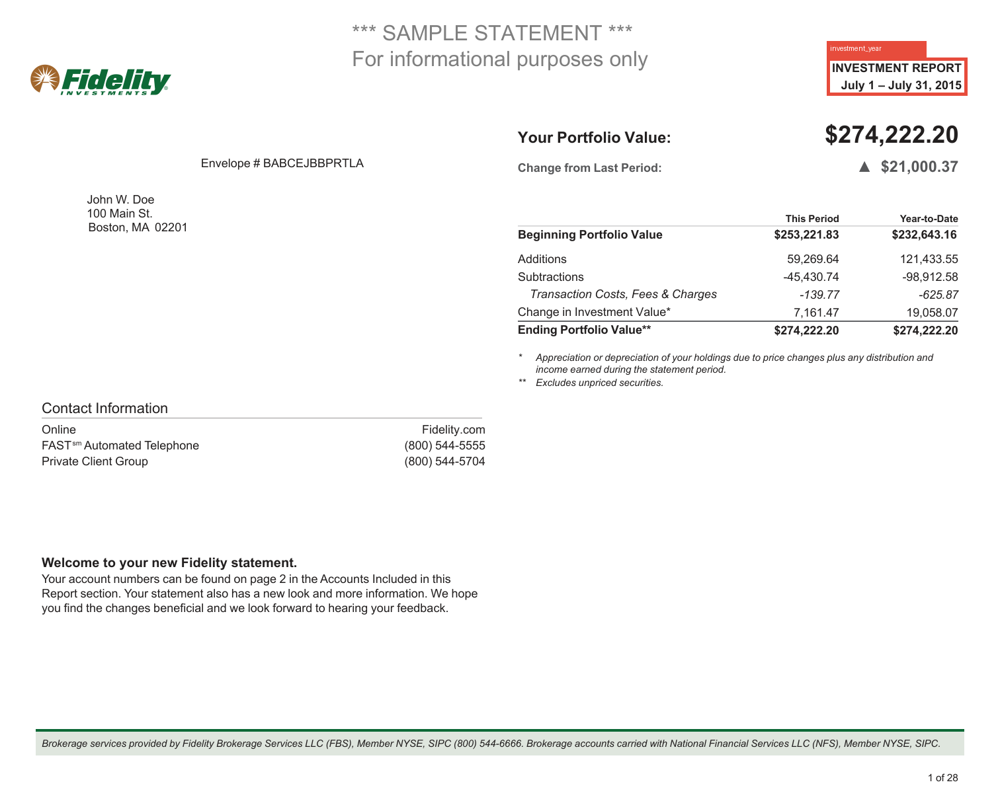


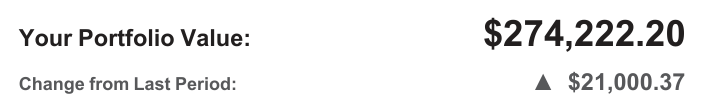
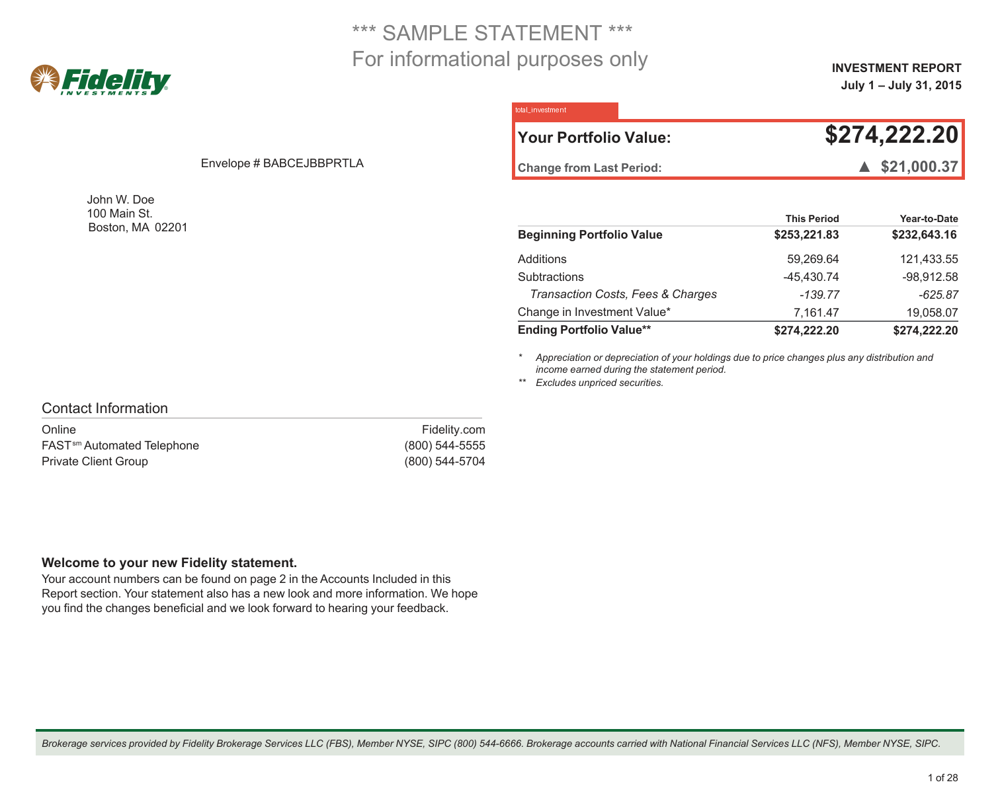


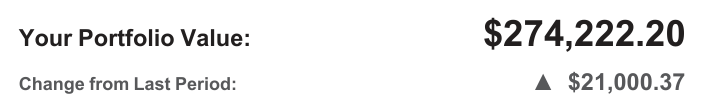
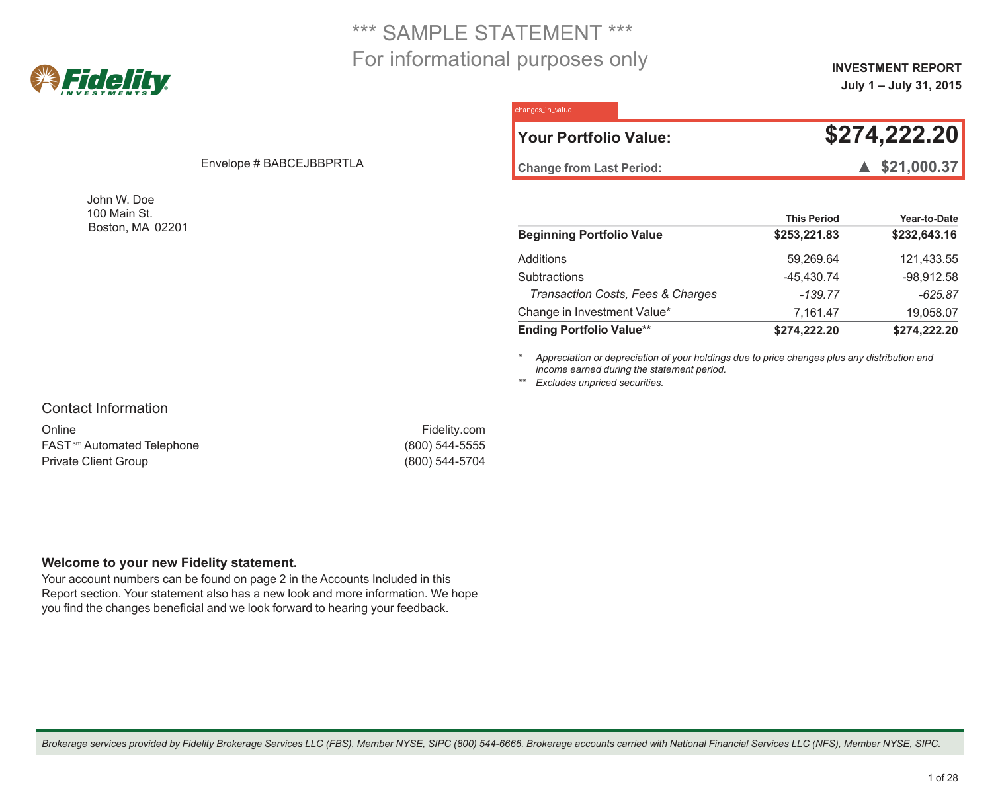


🔍 Extraction Metadata (Source Chunks):
  • investment_year: chunk IDs [d009ee84-0a0e-44c4-af2a-fdabde60046a]
  • total_investment: chunk IDs [3c7f6001-861d-497f-a6c0-0a83bb800cfe]
  • changes_in_value: chunk IDs [3c7f6001-861d-497f-a6c0-0a83bb800cfe]



✅ Visualization complete!


In [23]:
visualize_extractions_side_by_side(final_extractions, parse_result, merged_document)